In [1]:
!git clone https://github.com/eric-taylor-geo/sea-ice.git

Cloning into 'sea-ice'...
remote: Enumerating objects: 66, done.
remote: Counting objects: 100% (66/66), done.
remote: Compressing objects: 100% (53/53), done.
remote: Total 66 (delta 16), reused 60 (delta 10), pack-reused 0 (from 0)
Receiving objects: 100% (66/66), 3.32 MiB | 50.67 MiB/s, done.
Resolving deltas: 100% (16/16), done.


In [3]:
%cd sea-ice
!pip install -e .

/content/sea-ice
Obtaining file:///content/sea-ice
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
  Building editable for sea-ice (pyproject.toml) ... done
  Created wheel for sea-ice: filename=sea_ice-0.1.0-0.editable-py3-none-any.whl size=1435 sha256=d1295898582c0045642eee0f6c9c5cf09ab930d3b2dd875466978ca815672267
  Stored in directory: /tmp/pip-ephem-wheel-cache-fsjn69ey/wheels/0c/60/88/4aa55beb70ca4dedd294a9c0430357074225621d9ec8716a64
Successfully built sea-ice


In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
# if in colab, run this class after installing the package to mount drive (seaice data is not included in the package)
class DatasetSplitPaths:
    train_x: str = "/content/drive/MyDrive/ice_challenge_test/X"
    train_y: str = "/content/drive/MyDrive/ice_challenge_test/y"
    test_x: str = "/content/drive/MyDrive/ice_challenge_test/test/X"
    test_y: str = "/content/drive/MyDrive/ice_challenge_test/test/y"

# # else if data is downloaded locally:
# class DatasetSplitPaths:
#     train_x: str = "seaice_data/train/X"
#     train_y: str = "seaice_data/train/Y"
#     test_x: str = "seaice_data/test/X"
#     test_y: str = "seaice_data/test/Y"

In [8]:
from seaice.data.data import get_train_test_arrays
from seaice.data.data_loader import create_data_loader

X_train, y_train, X_test, y_test = get_train_test_arrays(
    patch_size=128,
    train_patches_per_scene=500,
    test_patches_per_scene=500,
    seed=42,
    paths=DatasetSplitPaths()
)

train_loader, test_loader = create_data_loader(
    X_train, y_train, X_test, y_test
)



In [9]:
import torch
from seaice.models.unet import UNet

device = torch.device('cpu') if not torch.cuda.is_available() else torch.device('cuda')
model = UNet(in_channels=2, out_channels=1).to(device)

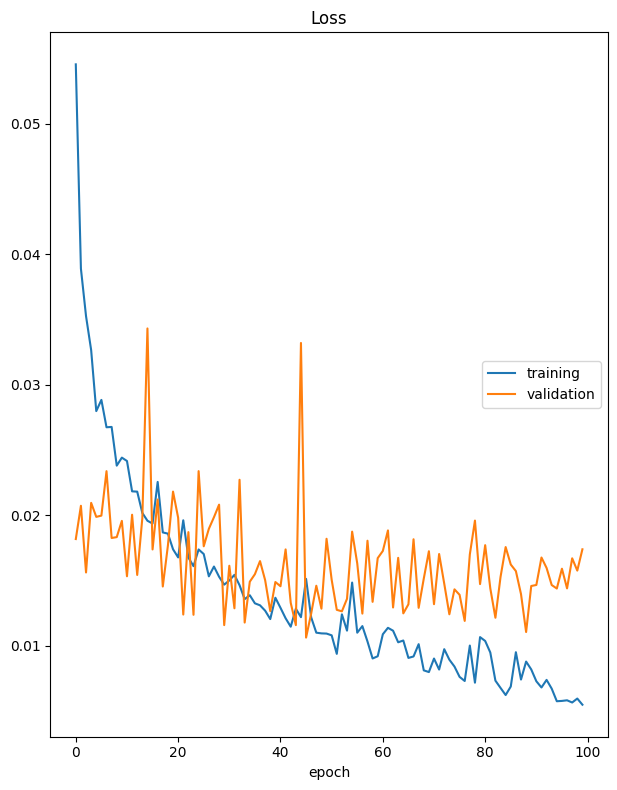

Loss
	training         	 (min:    0.006, max:    0.055, cur:    0.006)
	validation       	 (min:    0.011, max:    0.034, cur:    0.017)


In [11]:
from seaice.training.runner import run_epochs
from seaice.training.loss import MaskedMSELoss

run_epochs(
    model,
    torch.optim.Adam(model.parameters(), lr=1e-3),
    MaskedMSELoss(),
    train_loader,
    test_loader,
    device=device,
    num_epochs=100,
)

In [12]:
torch.save(model.state_dict(), "/content/drive/MyDrive/unet_sea_ice_model_100_epochs.pth")

In [15]:
# ==========================================
# Test
# ==========================================

import xarray as xr
import numpy as np

test = xr.open_dataset("/content/drive/MyDrive/ice_challenge_test/X/20201013T080448_dmi_prep.nc")

test_X = np.dstack((test.nersc_sar_primary.values, test.nersc_sar_secondary.values))

test_y = xr.open_dataset("/content/drive/MyDrive/ice_challenge_test/y/20201013T080448_dmi_prep_reference.nc").SIC.values

# # center index
# c = 3000
# h = 1024

# test_X = test_X[c - h : c + h, c - h : c + h, :]
# test_y = test_y[c - h : c + h, c - h : c + h]

In [16]:
from seaice.predict.sliding_window import predict_sliding_window

pred_mask = predict_sliding_window(model, test_X, stride=32)

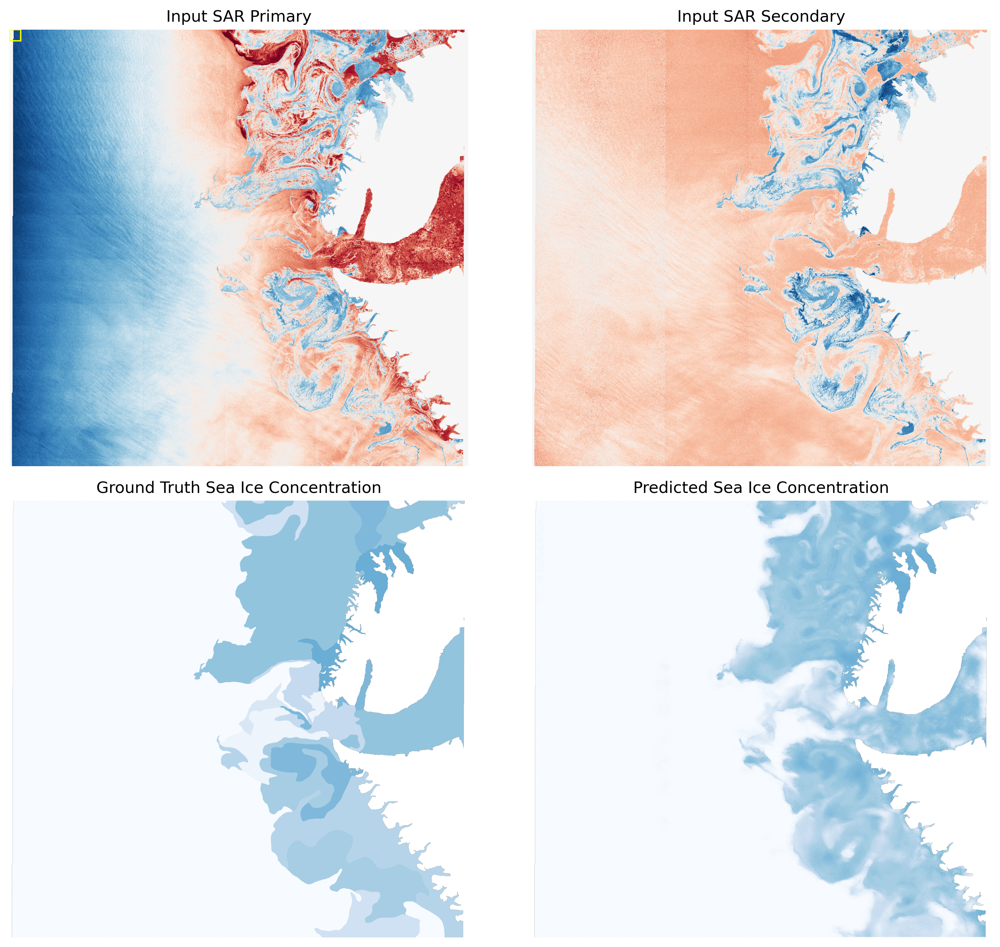

In [19]:
from seaice.visualisation import plot_prediction

pred_mask_land_mask = np.where(test_y > 100, np.nan, pred_mask*10)
test_y_land_mask = np.where(test_y > 100, np.nan, test_y)

plot_prediction(test_X, test_y_land_mask, pred_mask_land_mask)